# Human Transcriptomic Clock

Loading the required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings("ignore")

### Loading the Data

In [2]:
ensembl_meta = pd.read_csv("mart_export.csv")

raw_data = pd.read_csv("raw_expression_970_samples.tsv", sep = "\t", header = 0)
raw_data = raw_data.drop(columns=['KU10K-02988'], axis=1)           # Removing the Defective Sample 

meta_data = pd.read_csv("metadata_970_samples.tsv", sep = "\t", header = 0)
i = meta_data[meta_data["Project-ID"] == "KU10K-02988"].index       # Removing the Defective Sample 
meta_data = meta_data.drop(index = i)
meta_data.set_index("Project-ID", inplace = True)

In [3]:
raw_data["Gene stable ID"] = raw_data["ID"].str.split(".", expand = True)[0]
raw_data = raw_data.drop(columns = ["ID"])
raw_data.set_index("Gene stable ID", inplace = True)
raw_data

,KU10K-01407,KU10K-00493,KU10K-04958,KU10K-03600,KU10K-01113,KU10K-00284,KU10K-01474,KU10K-10325,KU10K-01435,KU10K-03680,...,KU10K-03529,KU10K-03499,KU10K-00281,KU10K-03509,KU10K-03492,KU10K-03518,KU10K-03497,KU10K-03490,KU10K-00051,KU10K-03488
Gene stable ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,6.00,0.00,6.00,27.00,7.00,3.00,8.00,2.00,6.00,16.00,...,18.00,16.00,8.00,5.00,26.00,3.00,9.00,6.00,7.00,10.00
ENSG00000000005,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
ENSG00000000419,549.63,370.24,153.34,1083.00,358.12,388.43,357.30,166.00,476.81,698.42,...,1306.80,514.42,330.25,439.84,398.00,127.17,422.00,587.96,367.23,386.00
ENSG00000000457,449.28,372.73,233.28,799.43,409.58,298.53,289.95,231.50,460.64,586.05,...,1096.29,709.39,325.44,547.83,529.96,187.13,530.06,633.83,477.62,465.32
ENSG00000000460,76.72,46.27,24.72,94.57,51.42,54.47,59.05,52.50,77.36,133.95,...,194.71,126.61,51.56,153.17,102.04,23.87,93.94,119.17,82.38,83.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000291313,13.43,0.00,2.20,9.66,11.84,3.85,0.00,6.37,7.59,17.05,...,6.10,0.00,5.55,2.71,14.57,18.75,30.80,20.28,24.97,0.00
ENSG00000291314,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ENSG00000291315,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,1.52,0.00,0.00,0.00,0.00,0.48,0.00,0.00


### TPM Transformation

In [4]:
def tpm(df, ensembl):

    ensembl = ensembl[["Gene stable ID", "Gene stable ID version", "Gene name", "Gene start (bp)", "Gene end (bp)"]]
    ensembl["Gene length (bp)"] = ensembl["Gene end (bp)"] - ensembl["Gene start (bp)"]
    ensembl["Gene length (kbp)"] = ensembl["Gene length (bp)"] / 1000

    common = set(ensembl["Gene stable ID"]) & set(df.index)
    ensembl_fil = ensembl[ensembl["Gene stable ID"].isin(common)]
    ensembl_fil = ensembl_fil.drop_duplicates(subset = ["Gene stable ID"])
    df = df[df.index.isin(common)]
    df = df[~df.index.duplicated(keep='first')]

    df = df.div(ensembl_fil["Gene length (kbp)"].tolist(), axis=0)
    
    total_RPK = {}
    for i in df.columns:
        total_RPK[i] = df[i].sum()

    for i in df.columns:
        df[i] = df[i] / total_RPK[i] * 1000000

    return df

In [5]:
raw_tpm = tpm(raw_data, ensembl_meta)
raw_tpm

,KU10K-01407,KU10K-00493,KU10K-04958,KU10K-03600,KU10K-01113,KU10K-00284,KU10K-01474,KU10K-10325,KU10K-01435,KU10K-03680,...,KU10K-03529,KU10K-03499,KU10K-00281,KU10K-03509,KU10K-03492,KU10K-03518,KU10K-03497,KU10K-03490,KU10K-00051,KU10K-03488
Gene stable ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,1.060031,0.000000,2.284355,4.960242,0.966176,0.667032,2.034470,1.443527,1.602335,3.639650,...,2.719546,3.975061,1.483372,1.682665,7.392965,0.379904,2.722261,1.968063,1.549776,3.403734
ENSG00000000005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022217,0.000000,0.000000,0.000000
ENSG00000000419,99.960111,117.558396,60.097572,204.812612,50.883369,88.905200,93.537002,123.336627,131.080064,163.548077,...,203.246070,131.562098,63.036501,152.374247,116.497742,16.577761,131.398002,198.529312,83.694730,135.248363
ENSG00000000457,3.566275,5.165426,3.990437,6.598575,2.539964,2.982249,3.312951,7.507173,5.527063,5.989698,...,7.441833,7.918437,2.711201,8.283314,6.770473,1.064697,7.203487,9.340951,4.750988,7.116032
ENSG00000000460,12.821596,13.500411,8.902811,16.434588,6.713617,11.456421,14.205206,35.844331,19.542717,28.823631,...,27.827775,29.754876,9.043559,48.760456,27.446191,2.859373,26.878440,36.976090,17.252774,26.942853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000291313,0.000678,0.000000,0.000239,0.000507,0.000467,0.000245,0.000000,0.001314,0.000579,0.001108,...,0.000263,0.000000,0.000294,0.000261,0.001184,0.000679,0.002663,0.001901,0.001580,0.000000
ENSG00000291314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ENSG00000291315,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.001059,0.000000,0.000000,0.000000,0.000000,0.000592,0.000000,0.000000


### Feature Selection

In [6]:
raw_tpm = raw_tpm.loc[~(raw_tpm == 0).all(axis=1)]
raw_tpm_fil = raw_tpm[raw_tpm.median(axis = 1) > 0.1]
raw_tpm_fil

,KU10K-01407,KU10K-00493,KU10K-04958,KU10K-03600,KU10K-01113,KU10K-00284,KU10K-01474,KU10K-10325,KU10K-01435,KU10K-03680,...,KU10K-03529,KU10K-03499,KU10K-00281,KU10K-03509,KU10K-03492,KU10K-03518,KU10K-03497,KU10K-03490,KU10K-00051,KU10K-03488
Gene stable ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,1.060031,0.000000,2.284355,4.960242,0.966176,0.667032,2.034470,1.443527,1.602335,3.639650,...,2.719546,3.975061,1.483372,1.682665,7.392965,0.379904,2.722261,1.968063,1.549776,3.403734
ENSG00000000419,99.960111,117.558396,60.097572,204.812612,50.883369,88.905200,93.537002,123.336627,131.080064,163.548077,...,203.246070,131.562098,63.036501,152.374247,116.497742,16.577761,131.398002,198.529312,83.694730,135.248363
ENSG00000000457,3.566275,5.165426,3.990437,6.598575,2.539964,2.982249,3.312951,7.507173,5.527063,5.989698,...,7.441833,7.918437,2.711201,8.283314,6.770473,1.064697,7.203487,9.340951,4.750988,7.116032
ENSG00000000460,12.821596,13.500411,8.902811,16.434588,6.713617,11.456421,14.205206,35.844331,19.542717,28.823631,...,27.827775,29.754876,9.043559,48.760456,27.446191,2.859373,26.878440,36.976090,17.252774,26.942853
ENSG00000000938,153.364051,293.099365,163.309455,227.747925,176.228458,202.626327,174.959093,397.997718,209.822038,250.006800,...,193.070363,227.319900,114.654574,444.801547,218.862137,57.094262,404.018943,361.288953,188.455981,334.364274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000291266,3.474076,4.481314,4.929613,7.070472,3.566016,2.544657,2.269574,8.587494,4.287192,6.439376,...,7.106987,8.039055,3.028360,10.521919,4.739416,0.927364,6.188927,11.609733,4.682700,6.519506
ENSG00000291286,0.000000,0.203692,0.251423,0.727918,0.273446,0.000000,0.000000,0.000000,0.529073,0.300443,...,0.399095,0.000000,0.857137,1.333433,0.938874,0.000000,0.798986,1.949496,0.543884,0.449550
ENSG00000291299,13.578307,19.020807,9.344401,10.287910,9.388864,13.642109,17.022946,16.227008,19.771079,19.861310,...,9.105140,23.174870,7.223260,34.016108,28.693675,3.406351,24.168183,40.970328,7.106420,36.714811


### Quantilization

In [7]:
def make_quant(df, q):

    qua=1/q
    dat_quant = df.copy()
    dat_quant[df.le(df.quantile(qua, axis=1), axis=0)] = 2
    for i in range(1, q):
        dat_quant[(df.le(df.quantile((i + 1) * qua, axis=1), axis=0)) &
                        (df.gt(df.quantile(i*qua, axis=1), axis=0))] = i+2
    dat_quant -=1
    return dat_quant

In [8]:
raw_qunat = make_quant(raw_tpm_fil.T, 10)
raw_qunat

Gene stable ID,ENSG00000000003,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,ENSG00000001460,...,ENSG00000291228,ENSG00000291233,ENSG00000291236,ENSG00000291237,ENSG00000291258,ENSG00000291266,ENSG00000291286,ENSG00000291299,ENSG00000291300,ENSG00000291316
KU10K-01407,5.0,10.0,7.0,8.0,10.0,9.0,10.0,10.0,8.0,8.0,...,2.0,2.0,4.0,9.0,2.0,7.0,1.0,8.0,6.0,8.0
KU10K-00493,1.0,10.0,7.0,8.0,10.0,9.0,10.0,10.0,8.0,8.0,...,1.0,3.0,4.0,10.0,6.0,6.0,2.0,8.0,8.0,8.0
KU10K-04958,6.0,10.0,7.0,8.0,10.0,8.0,10.0,10.0,8.0,8.0,...,1.0,3.0,4.0,9.0,5.0,7.0,2.0,8.0,8.0,7.0
KU10K-03600,6.0,10.0,7.0,8.0,10.0,8.0,10.0,10.0,8.0,8.0,...,1.0,2.0,3.0,9.0,3.0,7.0,3.0,7.0,8.0,7.0
KU10K-01113,5.0,10.0,7.0,8.0,10.0,8.0,10.0,10.0,8.0,8.0,...,1.0,1.0,3.0,10.0,6.0,7.0,3.0,8.0,8.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KU10K-03518,5.0,10.0,7.0,8.0,10.0,8.0,10.0,10.0,8.0,8.0,...,1.0,3.0,5.0,10.0,2.0,7.0,1.0,8.0,5.0,8.0
KU10K-03497,5.0,10.0,7.0,8.0,10.0,9.0,10.0,10.0,8.0,8.0,...,1.0,2.0,3.0,10.0,6.0,7.0,3.0,8.0,6.0,7.0
KU10K-03490,4.0,10.0,7.0,8.0,10.0,9.0,10.0,10.0,9.0,8.0,...,1.0,2.0,2.0,9.0,3.0,7.0,4.0,9.0,7.0,7.0
KU10K-00051,5.0,10.0,7.0,8.0,10.0,8.0,10.0,10.0,8.0,8.0,...,1.0,3.0,4.0,10.0,3.0,7.0,3.0,7.0,7.0,7.0


### Defing the Datasets for Training and Testing

In [9]:
meta_data_trait = meta_data[["Sample_Age", "Sample_Trait"]]
data_merge = pd.merge(raw_qunat, meta_data_trait, left_index = True, right_index = True)
raw_samples_healthy = data_merge[data_merge['Sample_Trait'] == 'Healthy']

In [10]:
X = raw_samples_healthy.drop(columns=['Sample_Age', 'Sample_Trait'])
y = raw_samples_healthy["Sample_Age"]

kf = KFold(n_splits=5, shuffle=True, random_state=42)

alphas = np.linspace(0, 1, 10)
l1_ratios = [0.2, 0.4, 0.6, 0.8]

In [11]:
results = []

### Random Forest Regression as Feature Selection

In [12]:
rf_model = RandomForestRegressor(random_state=42)
rf_preds = []
rf_true = []

with tqdm(total=kf.get_n_splits(), desc="Random Forest CV") as pbar:
    
    feature_imp_score = np.zeros(X.shape[1])

    for train_index, test_index in kf.split(X):
        
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)

        rf_preds.extend(y_pred)
        rf_true.extend(y_test)

        feature_imp_score += rf_model.feature_importances_

        pbar.update(1)

feature_imp_score /= kf.n_splits

Random Forest CV:   0%|          | 0/5 [00:00<?, ?it/s]

Random Forest CV: 100%|██████████| 5/5 [08:08<00:00, 97.71s/it]


In [13]:
imp_feature_index = np.argsort(feature_imp_score)[::-1]
top_n_feature = len(imp_feature_index) // 2
selected_features = X.columns[imp_feature_index[:top_n_feature]]

### Linear Regression Model

In [14]:
lr_model = LinearRegression()

for train_index, test_index in kf.split(X):
    
    X_train_lr, X_test_lr = X.iloc[train_index][selected_features], X.iloc[test_index][selected_features]
    y_train_lr, y_test_lr = y.iloc[train_index], y.iloc[test_index]

    lr_model.fit(X_train_lr, y_train_lr)

    y_pred_lr = lr_model.predict(X_test_lr)

    results.append({
        'Model': 'Linear Regression',
        'Alpha': None,
        'l1 Ratio': None,
        'MSE': mean_squared_error(y_test_lr, y_pred_lr),
        'R2': r2_score(y_test_lr, y_pred_lr)
    })

### Ridge Regression Model

In [15]:
with tqdm(total=len(alphas) * kf.get_n_splits(), desc="Ridge CV") as pbar:

    for alpha in alphas:
        ridge_model = Ridge(alpha=alpha, random_state=42)

        for train_index, test_index in kf.split(X):

            X_train = X.iloc[train_index][selected_features]
            X_test  = X.iloc[test_index][selected_features]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            ridge_model.fit(X_train, y_train)
            y_pred = ridge_model.predict(X_test)

            results.append({
                'Model': 'Ridge Regression',
                'Alpha': alpha,
                'l1 Ratio': None,
                'MSE': mean_squared_error(y_test, y_pred),
                'R2': r2_score(y_test, y_pred)
            })

            pbar.update(1)

Ridge CV: 100%|██████████| 50/50 [00:17<00:00,  2.83it/s]


### Lasso Regression Model

In [16]:
with tqdm(total=len(alphas) * kf.get_n_splits(), desc="Lasso CV") as pbar:

    for alpha in alphas:
        lasso_model = Lasso(alpha=alpha, random_state=42)

        for train_index, test_index in kf.split(X):

            X_train = X.iloc[train_index][selected_features]
            X_test  = X.iloc[test_index][selected_features]
            y_train, y_test = y.iloc[train_index], y.iloc[test_index]

            lasso_model.fit(X_train, y_train)
            y_pred = lasso_model.predict(X_test)

            results.append({
                'Model': 'Lasso Regression',
                'Alpha': alpha,
                'l1 Ratio': None,
                'MSE': mean_squared_error(y_test, y_pred),
                'R2': r2_score(y_test, y_pred)
            })

            pbar.update(1)

Lasso CV: 100%|██████████| 50/50 [00:37<00:00,  1.32it/s]


### Elastic-Net Regression Model

In [17]:
with tqdm(total=len(alphas)*len(l1_ratios)*kf.get_n_splits(), desc="ElasticNet CV") as pbar:

    for alpha in alphas:
        for l1_ratio in l1_ratios:

            enet = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, random_state=42)

            for train_index, test_index in kf.split(X):

                X_train = X.iloc[train_index][selected_features]
                X_test  = X.iloc[test_index][selected_features]
                y_train, y_test = y.iloc[train_index], y.iloc[test_index]

                enet.fit(X_train, y_train)
                y_pred = enet.predict(X_test)

                results.append({
                    'Model': 'ElasticNet',
                    'Alpha': alpha,
                    'l1 Ratio': l1_ratio,
                    'MSE': mean_squared_error(y_test, y_pred),
                    'R2': r2_score(y_test, y_pred)
                })

                pbar.update(1)

ElasticNet CV: 100%|██████████| 200/200 [07:05<00:00,  2.13s/it]


### MLP Regression Model

In [18]:
mlp = MLPRegressor(hidden_layer_sizes=(100,),
                   max_iter=2000,
                   random_state=42)

with tqdm(total=kf.get_n_splits(), desc="MLP CV") as pbar:

    for train_index, test_index in kf.split(X):

        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        mlp.fit(X_train, y_train)
        y_pred = mlp.predict(X_test)

        results.append({
            'Model': 'MLP',
            'Alpha': None,
            'l1 Ratio': None,
            'MSE': mean_squared_error(y_test, y_pred),
            'R2': r2_score(y_test, y_pred)
        })

        pbar.update(1)


MLP CV: 100%|██████████| 5/5 [08:26<00:00, 101.39s/it]


### Choosing the Best Model

In [19]:
results_df = pd.DataFrame(results)
results_df

,Model,Alpha,l1 Ratio,MSE,R2
0,Linear Regression,NaN,NaN,54.502540,0.812261
1,Linear Regression,NaN,NaN,76.408548,0.718473
2,Linear Regression,NaN,NaN,68.048865,0.741986
3,Linear Regression,NaN,NaN,75.539252,0.747704
4,Linear Regression,NaN,NaN,71.594881,0.704422
...,...,...,...,...,...
305,MLP,NaN,NaN,69.704797,0.759895
306,MLP,NaN,NaN,116.943485,0.569123
307,MLP,NaN,NaN,104.622580,0.603313
308,MLP,NaN,NaN,111.661320,0.627059


In [20]:
best_row = results_df.sort_values("MSE").iloc[0]
best_model_name = best_row["Model"]
best_alpha = best_row["Alpha"]
best_l1 = best_row["l1 Ratio"]

if best_model_name == "ElasticNet":
    best_model = ElasticNet(alpha=best_alpha,
                            l1_ratio=best_l1,
                            max_iter=5000)

elif best_model_name == "Ridge Regression":
    best_model = Ridge(alpha=best_alpha)

elif best_model_name == "Lasso Regression":
    best_model = Lasso(alpha=best_alpha)

elif best_model_name == "Linear Regression":
    best_model = LinearRegression()

elif best_model_name == "MLP":
    best_model = MLPRegressor(max_iter=2000, random_state=42)

In [23]:
best_row

Model       ElasticNet
Alpha         0.555556
l1 Ratio           0.8
MSE          45.325522
R2            0.843872
Name: 220, dtype: object

In [21]:
best_preds = []
best_true = []

for train_index, test_index in kf.split(X):

    X_train = X.iloc[train_index][selected_features]
    X_test  = X.iloc[test_index][selected_features]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    lr_model.fit(X_train, y_train)
    y_pred = lr_model.predict(X_test)

    best_preds.extend(y_pred)
    best_true.extend(y_test)

## Results of the Best Model

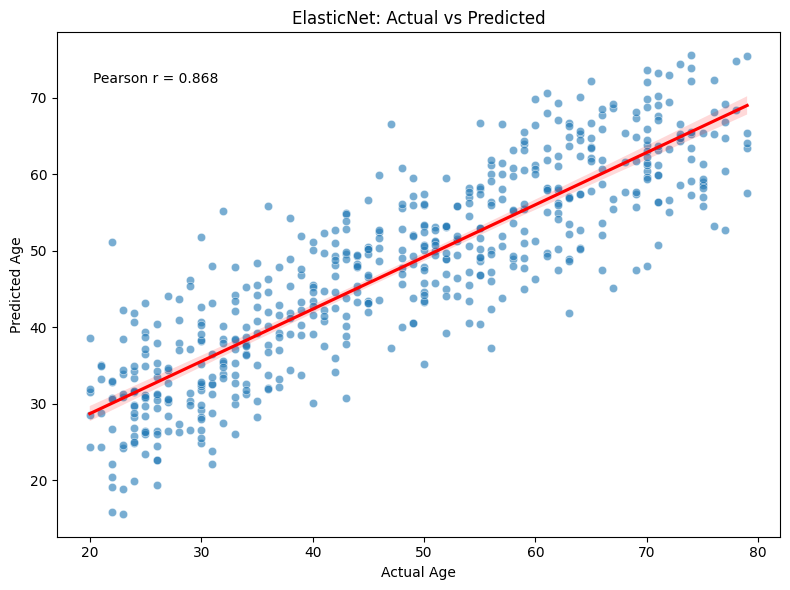

In [ ]:
plt.figure(figsize=(8,6))

sns.scatterplot(x=best_true, y=best_preds, alpha=0.6)
sns.regplot(x=best_true, y=best_preds, scatter=False, color="red")

plt.xlabel("Actual Age")
plt.ylabel("Predicted Age")
plt.title(f"{best_model_name}: Actual vs Predicted")

plt.text(0.05, 0.9, f"R2 Score = {best_row['r2 Score']:.3f}",
         transform=plt.gca().transAxes)

plt.tight_layout()